TensorFlow Speech Recognition Challenge

In [1]:
import os
from os.path import isdir, join
from pathlib import Path
import pandas as pd

# Math
import numpy as np
from scipy.fftpack import fft
from scipy import signal
from scipy.io import wavfile
# pip install librosa==0.62
# pip install numba==0.48 # 만약 설치가 안된다면, 관리자 권한으로 설치!
import librosa

from sklearn.decomposition import PCA

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import IPython.display as ipd
import librosa.display

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import pandas as pd

%matplotlib inline

# 1. Visualization of recordings - input features

인간의 청각에는 두가지 이론이 있다. 장소와 시간은 음성인식에서 중요한 영향으로 본다.
스펙트럼 분석(주파수)입력 및 보다 정교한 feature MFCC(Mel Frequencey Cepstral Coefficients)

## 1.1. Wave and spectrogram

In [2]:
# 몇개 파일을 불러온다.
train_audio_path = '../data/tensorflow-speech-recognition-challenge/train/audio/'
filename = '/yes/0a7c2a8d_nohash_0.wav'
sample_rate, samples = wavfile.read(str(train_audio_path) + filename)

In [29]:
'''
spectrogram을 계산하는 함수 정의한다. 
참고로, 우리는 spectrogram 값의 로그를 취하고 있다. 
그것은 우리의 plot을 훨씬 더 명확하게 할 것이고, 더욱이 그것은 사람들이 듣는 방식과 엄격히 연결되어 있다. 
로그에 대한 입력으로 0 값이 없다는 보장이 필요하다.
'''

def log_specgram(audio, sample_rate, window_size=20, step_size=10, eps=1e-10):
    nperseg = int(round(window_size * sample_rate / 1e3))
    noverlap = int(round(step_size * sample_rate /1e3))
    freqs, times, spec = signal.spectrogram(audio,
                                           fs=sample_rate,
                                           window='hann',
                                           nperseg=nperseg,
                                           noverlap=noverlap,
                                           detrend=False)
    return freqs, times, np.log(spec.T.astype(np.float32) + eps)

Nyquist theorem에 따르면, 주파수(Frequencies) 범위는 0~8000 정도 된다.

Text(0.5, 0, 'seconds')

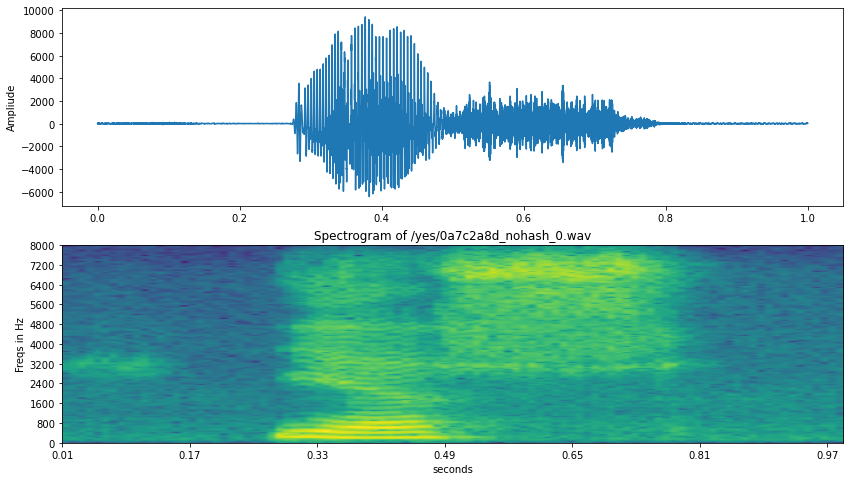

In [4]:
freqs, times, spectrogram = log_specgram(samples, sample_rate)

fig = plt.figure(figsize=(14,8))
ax1 = fig.add_subplot(211)
ax1.set_title=('Raw wave of '+ filename)
ax1.set_ylabel('Ampliude')
ax1.plot(np.linspace(0, sample_rate/len(samples), sample_rate), samples)

ax2 = fig.add_subplot(212)
ax2.imshow(spectrogram.T, aspect='auto', origin='lower',
          extent =[times.min(), times.max(), freqs.min(), freqs.max()])
ax2.set_yticks(freqs[::16])
ax2.set_xticks(times[::16])
ax2.set_title('Spectrogram of '+filename)
ax2.set_ylabel('Freqs in Hz')
ax2.set_xlabel('seconds')

만약 NN을 입력변수로써 spectrogram에 사용한다면 우리는 변수를 정규화하는 것을 기억해야한다.

In [5]:
mean = np.mean(spectrogram, axis=0)
std = np.std(spectrogram, axis=0)
spectrogram = (spectrogram - mean) / std

# mean = np.mean(spectrogram, axis=0)
# std = np.std(spectrogram, axis=0)
# spectrogram = (spectrogram-mean)/std

## 1.2. MFCC
MFCC에 대한 자세한 내용을 알고 싶다면 이 [튜토리얼](http://practicalcryptography.com/miscellaneous/machine-learning/guide-mel-frequency-cepstral-coefficients-mfccs/)을 보면된다. MFCC는 인간의 청력 특성을 모방할 준비가 잘 되어 있다는 것을 알 수 있다고 설명했다.
librosa python package를 사용하여 Mel power spectrogram과 MFCC를 계산할 수 있다.

c:\users\hanbit\appdata\local\programs\python\python37\lib\site-packages\librosa\display.py:797: MatplotlibDeprecationWarning:

The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.

c:\users\hanbit\appdata\local\programs\python\python37\lib\site-packages\librosa\display.py:797: MatplotlibDeprecationWarning:

The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.



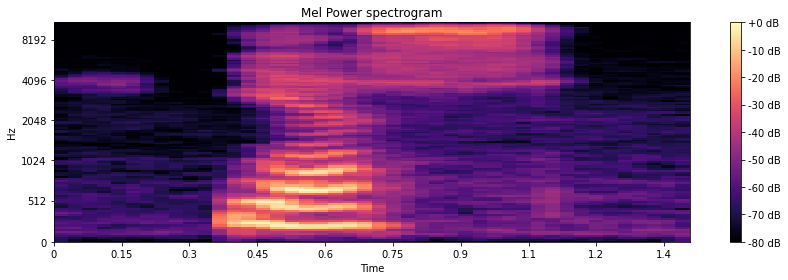

In [6]:
librosa_samples, librosa_sample_rate = librosa.load(str(train_audio_path)+filename)
S = librosa.feature.melspectrogram(librosa_samples, sr=librosa_sample_rate, n_mels=128, fmax=8000)

# log scale 전환(dB). 우리는 peak power(max)만을 사용할 것이다.
log_S = librosa.power_to_db(S, ref=np.max)

plt.figure(figsize=(12,4))
librosa.display.specshow(log_S, sr=sample_rate, x_axis='time', y_axis='mel')
plt.title('Mel Power spectrogram')
plt.colorbar(format='%+02.0f dB')
plt.tight_layout()

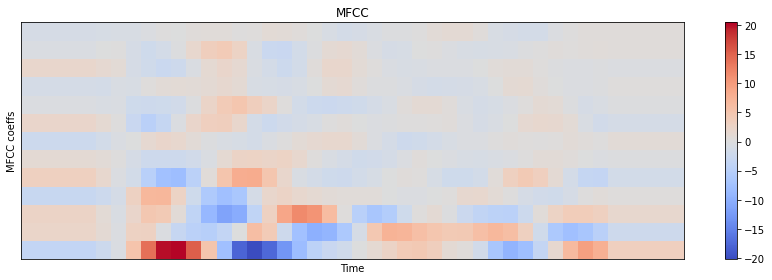

In [7]:
mfcc = librosa.feature.mfcc(S=log_S, n_mfcc=13)

delta2_mfcc =  librosa.feature.delta(mfcc, order=2)

plt.figure(figsize=(12,4))
librosa.display.specshow(delta2_mfcc)
plt.ylabel('MFCC coeffs')
plt.xlabel('Time')
plt.title('MFCC')
plt.colorbar()
plt.tight_layout()

## 1.3. Sprectrogram in 3d

In [8]:
data = [go.Surface(x=times, y=freqs, z=spectrogram.T)]
layout = go.Layout(
title='Specgtrogram of "yes" in 3d',
scene = dict(
yaxis = dict(title='Frequncy', range=[freqs.min(),freqs.max()]),
xaxis = dict(title='Time', range=[times.min(),times.max()],),
zaxis = dict(title='Log amplitude'),
),
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)


## 1.4. Silence removal
slience 구간 지우기

In [9]:
ipd.Audio(samples, rate=sample_rate)

나는 일부 VAD가 여기서 정말 유용할 것이라고 생각한다. 비록 말은 짧지만 그 속에는 침묵이 많다. 괜찮은 VAD는 훈련 크기를 많이 줄여 훈련 속도를 크게 높일 수 있다. 처음부터 끝까지 파일의 일부를 잘라내고 다시 들어보자(위의 줄거리를 바탕으로 4000에서 13000까지 가져간다).

In [10]:
samples_cut = samples[4000:13000]
ipd.Audio(samples_cut, rate=sample_rate)

우리는 전체 단어를 들을 수 있다는 것에 동의할 수 있다. 모든 파일을 수동으로 자르거나 간단한 플롯을 기준으로 하는 것은 불가능하다. 하지만 좋은 VAD를 갖기 위해 webrtcvad 패키지를 예로 들 수 있다.

추측된 'y' 'e' 's' 그래프의 정렬과 함께 다시 한 번 그려보자.

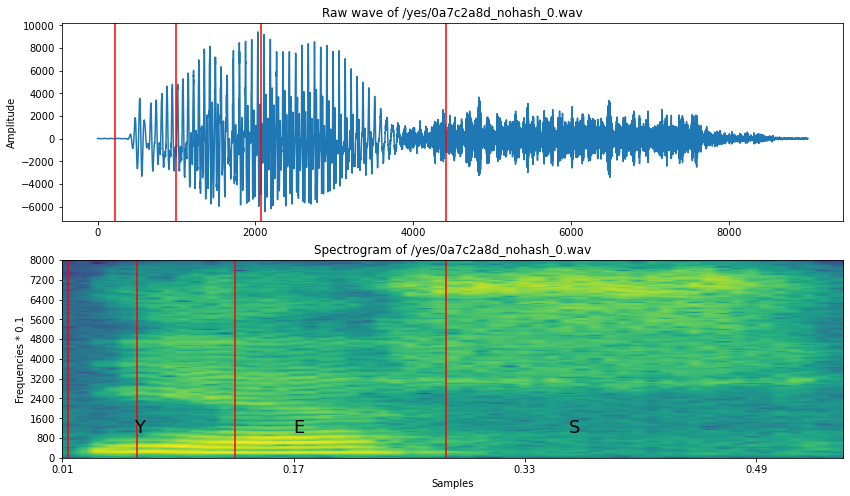

In [11]:
freqs, times, spectrogram_cut = log_specgram(samples_cut, sample_rate)

fig = plt.figure(figsize=(14,8))
ax1 = fig.add_subplot(211)
ax1.set_title('Raw wave of ' + filename)
ax1.set_ylabel('Amplitude')
ax1.plot(samples_cut)

ax2 = fig.add_subplot(212)
ax2.set_title('Spectrogram of ' + filename)
ax2.set_ylabel('Frequencies * 0.1')
ax2.set_xlabel('Samples')
ax2.imshow(spectrogram_cut.T, aspect='auto', origin='lower',
          extent=[times.min(), times.max(), freqs.min(), freqs.max()])

ax2.set_yticks(freqs[::16])
ax2.set_xticks(times[::16])
ax2.text(0.06, 1000, 'Y', fontsize=18)
ax2.text(0.17, 1000, 'E', fontsize=18)
ax2.text(0.36, 1000, 'S', fontsize=18)

xcoords =[0.025, 0.11, 0.23, 0.49]
for xc in xcoords:
#     ax1.axvline(x=xc*16000, c='r')
#     ax2.axvline(x=xc, c='r')
    ax1.axvline(x=xc*samples_cut.shape[0], c='r')
    ax2.axvline(x=(xc*samples_cut.shape[0])/sample_rate, c='r')


## 1.5. Resampling - dimensionality reductions

데이터의 치수성을 줄이는 또 다른 방법은 기록을 다시 샘플링하는 것이다.

녹음은 16k 주파수로 샘플링되기 때문에 자연스럽지 않다는 것을 들을 수 있고, 우리는 보통 훨씬 더 많이 듣는다. 그러나 가장 많은 음성 관련 주파수는 더 작은 대역으로 제시된다. 그렇기 때문에 당신은 GSM 신호가 8000Hz로 샘플링되는 전화와 통화하는 다른 사람을 여전히 이해할 수 있다.

요약하면 데이터 집합을 8k로 다시 샘플링할 수 있다. 우리는 중요하지 않아야 할 정보를 버리고 데이터의 크기를 줄일 것이다.

우리는 이것이 위험할 수 있다는 것을 기억해야 한다. 왜냐하면 이것은 경쟁이기 때문이다. 그리고 때로는 아주 작은 성과 차이가 이기기 때문에 우리는 아무것도 잃고 싶지 않다. 반면에, 첫 번째 실험은 작은 훈련 크기로 훨씬 더 빨리 할 수 있다.

FFT(Fast Fourier Transform)를 계산이 필요하다.

In [12]:
# fft 계산
def custom_fft(y, fs):
    T = 1.0 /fs
    N = y.shape[0]
    yf = fft(y)
    xf = np.linspace(0.0, 1.0/(2.0*T), N//2)
    # FFT는 시뮬레이션을 통해 전반부만 촬영한다.
    # FFT도 복잡해서 진짜 부분만 가져가면 된다. (abs)
#     vals = 2.0/N * np.abs(yf[0:N//2])
    vals = 2.0/N * np.abs(yf[0:N//2])
    return xf, vals

In [13]:
'''
녹음된 내용을 읽고 다시 샘플링한 후 들어보자.
또한 FFT, Notice를 비교할 수 있는데, 원래 신호에는 4000Hz 이상의 정보가 거의 없다.
'''

'\n녹음된 내용을 읽고 다시 샘플링한 후 들어보자.\n또한 FFT, Notice를 비교할 수 있는데, 원래 신호에는 4000Hz 이상의 정보가 거의 없다.\n'

In [14]:
filename = '/happy/0b09edd3_nohash_0.wav'
new_sample_rate = 8000
sample_rate, samples = wavfile.read(str(train_audio_path)+filename)
resampled = signal.resample(samples, int(new_sample_rate/sample_rate*samples.shape[0]))


In [15]:
ipd.Audio(samples, rate = sample_rate)

In [16]:
ipd.Audio(resampled, rate = new_sample_rate)

두개를 들어보면 거의 차이가 없다. 

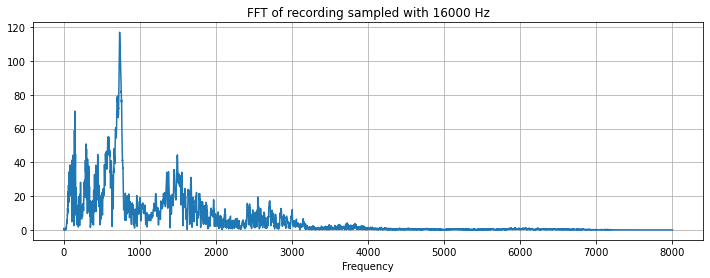

In [17]:
xf, vals = custom_fft(samples, sample_rate)
plt.figure(figsize=(12,4))
plt.title('FFT of recording sampled with '+ str(sample_rate) + ' Hz')
plt.plot(xf, vals)
plt.xlabel('Frequency')
plt.grid()
plt.show()

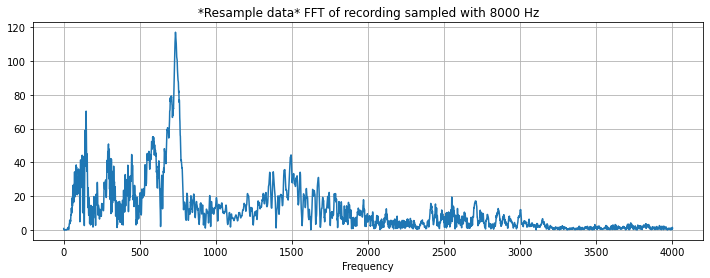

In [18]:
xf, vals = custom_fft(resampled, new_sample_rate)
plt.figure(figsize=(12,4))
plt.title('*Resample data* FFT of recording sampled with '+ str(new_sample_rate) + ' Hz')
plt.plot(xf, vals)
plt.xlabel('Frequency')
plt.grid()
plt.show()

이것이 데이터셋 크기를 두 번 줄인 방법이다!

## 1.6. Features extraction steps

변수 추출 알고리즘은 아래와 같이 진행한다.

1. Resampling 
2. VAD (Voice Activity Detection) 
3. 신호 길이가 같도록 0으로 padding 
4. Log spectrogram( or MFCC, or PLP)
5. 평균 및 표준 피쳐 정규화
6. 임시 정보를 얻기 위해 지정된 수의 프레임 쌓기

# 2. Dataset investigation

## 2.1. Number of files

In [19]:
dirs = [f for f in os.listdir(train_audio_path) if isdir(join(train_audio_path, f))]
dirs.sort()
print('Number of labels: ' + str(len(dirs)))

Number of labels: 31


In [20]:
dirs

['_background_noise_',
 'bed',
 'bird',
 'cat',
 'dog',
 'down',
 'eight',
 'five',
 'four',
 'go',
 'happy',
 'house',
 'left',
 'marvin',
 'nine',
 'no',
 'off',
 'on',
 'one',
 'right',
 'seven',
 'sheila',
 'six',
 'stop',
 'three',
 'tree',
 'two',
 'up',
 'wow',
 'yes',
 'zero']

In [21]:
# 계산
number_of_recordings = []
for direct in dirs:
    waves = [ f for f in os.listdir(join(train_audio_path, direct))
                if f.endswith('.wav')]
    number_of_recordings.append(len(waves))
    
# plot 
data = [go.Histogram(x=dirs, y = number_of_recordings)]
trace = go.Bar(
    x=dirs,
    y=number_of_recordings,
    marker=dict(color = number_of_recordings, colorscale='ylorrd',
               showscale=True),
)

layout = go.Layout(
    title='Number of recordings in given label',
    xaxis=dict(title='Words'),
    yaxis=dict(title='Number of recordings')
)
py.iplot(go.Figure(data=[trace], layout=layout))

데이터 셋은 background_noise 를 제외하고 균형있다. 하지만 다른것도 있다.

## 2.2. Deeper into recordings

아주 중요한 사실이 있다. 녹음은 매우 다른 출처에서 나온다. 내가 알기로는, 그들 중 일부는 이동형 GSM 채널에서 올 수 있다.

그럼에도 불구하고, 한명의 발화자가 test 와 train data으로 분리 되지 않는 것이 매우 중요하다. 이 두 가지 시험 유형을 보고 들어 보자.

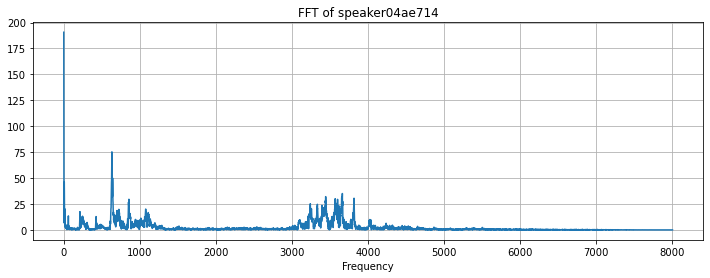

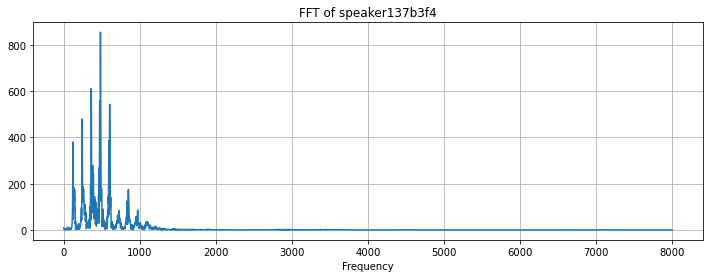

In [22]:
filenames = ['on/004ae714_nohash_0.wav', 'on/0137b3f4_nohash_0.wav']
for filename in filenames:
    sample_rate, samples = wavfile.read(str(train_audio_path) +
                                       filename)
    xf, vals = custom_fft(samples, sample_rate)
    plt.figure(figsize=(12,4))
    plt.title('FFT of speaker' + filename[4:11])
    plt.plot(xf, vals)
    plt.xlabel('Frequency')
    plt.grid()
    plt.show()
    

들어 보는 것이 더 정확할 수 있다.

In [23]:
print('Speaker ' + filenames[0][4:11])
ipd.Audio(join(train_audio_path, filenames[0]))

Speaker 04ae714


In [24]:
print('Speaker ' + filenames[1][4:11])
ipd.Audio(join(train_audio_path, filenames[1]))

Speaker 137b3f4


아래 녹음에는 이상한 침묵이 있다. 아마 압축하는 과정에서 생겼을수도 있다.

In [25]:
filename = '/yes/01bb6a2a_nohash_1.wav'
sample_rate, samples = wavfile.read(str(train_audio_path) + filename)
ipd.Audio(samples, rate = sample_rate)

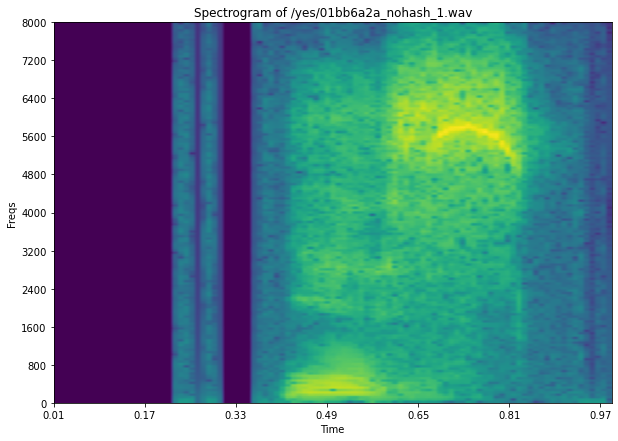

In [26]:
freqs, times, spectrogram = log_specgram(samples, sample_rate)

plt.figure(figsize=(10,7))
plt.title('Spectrogram of ' + filename)
plt.ylabel('Freqs')
plt.xlabel('Time')
plt.imshow(spectrogram.T, aspect='auto', origin='lower',
          extent=[times.min(), times.max(), freqs.min(), freqs.max()])
plt.yticks(freqs[::16])
plt.xticks(times[::16])
plt.show()

즉, 우리는 매우 특정한 음향 환경에서 과도하게 적응하는 것을 막아야 한다.

## 2.3. Recordings length
모든 파일이 1초동안 구성되어 있는지 확인해보자.

In [27]:
num_of_shorter= 0
for direct in dirs:
    waves= [f for f in os.listdir(join(train_audio_path, direct))
           if f.endswith('.wav')]
    for wav in waves:
        sample_rate, samples = wavfile.read(train_audio_path +
                                           direct + '/' + wav)
        print('확인 : ',samples.shape[0], sample_rate)
        if samples.shape[0] < sample_rate:
            num_of_shorter +=1
print('Number of recordings shorter than 1 second: '+ str(num_of_shorter))

c:\users\hanbit\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:7: WavFileWarning:

Chunk (non-data) not understood, skipping it.



확인 :  1522930 16000
확인 :  988891 16000
확인 :  980062 16000
확인 :  960000 16000
확인 :  978488 16000
확인 :  960000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 

확인 :  10923 16000
확인 :  12288 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  10923 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  15019 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  9660 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  15019 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  14118 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  15531 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11146 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  11606 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10240 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  10923 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  8192 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000

확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10240 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  14118 16000
확인 :  15702 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  11606 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  12632 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  8192 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11146 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1297

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  12971 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  12288 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  15019 16000
확인 :  13995 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  8192 16000
확인 :  15019 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923

확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  12971 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  10923 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  11606 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1228

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  12288 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13995 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  15604 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  11146 16000
확인 :  16000 16000
확인 :  11146 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  9660 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  11606 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  12632 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  14861 16000
확인 :  15604 16000
확인 :  9660 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  9558 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10403 16000
확인 :  12632

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  9660 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  15019 16000
확인 :  15019 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11146 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1433

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  9660 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  9660 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  8875 16000
확인 :  8875 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  9660 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 1

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10403 16000
확인 :  13654 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  12971 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  15019 16000
확인 :  15360 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10240 16000
확인 :  14336 16000
확인 :  12971 16000
확인 :  1433

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  14118 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  9558 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  8875 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13995 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  11889 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10240 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1297

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  14861 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  6688 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10240 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000

확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10403 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15360 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11146 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10240 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1411

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10403 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  12971 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  13375 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  9558 16000
확인 :  9558 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10240 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10403 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11146 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10240 16000
확인 :  11606 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10240 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  7431 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  11146 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  1228

확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  8875 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11146 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000

확인 :  14118 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  9558 16000
확인 :  10923 16000
확인 :  8192 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  12632 16000
확인 :  11146 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10240 16000
확인 :  15019 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  14118 16000
확인 :  11606 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11146 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13312 16000
확인 :  8363 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11606

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  8192 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13375

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  8917 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  14118 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14678 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  8192 16000
확인 :  13654

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  14336 16000
확인 :  15702 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10240 16000
확인 :  8192 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000

확인 :  11889 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  15019 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  11146 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  11606 16000
확인 :  11606 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  12971 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12480 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  1600

확인 :  13375 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10240 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  10923 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1501

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  8875 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  14861

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  11606 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  12971 16000
확인 :  12288 16000
확인 :  13654 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  15604 16000
확인 :  11889 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  10403 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  10240 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  11146 16000
확인 :  8174 16000
확인 :  11146 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15531 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  8192 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000

확인 :  16000 16000
확인 :  13375 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  12971 16000
확인 :  11606 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15360 16000
확인 :  12971 16000
확인 :  15702 16000
확인 :  15019 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  11889 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  9728 16000
확인 :  9899 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  8875 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  13654 1

확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10403 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11146 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  8875 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  9660 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  8875 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  9558 16000
확인 :  11606 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  1600

확인 :  16000 16000
확인 :  11146 16000
확인 :  11889 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  10923 16000
확인 :  9558 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  13375

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  12971 16000
확인 :  10240 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  9660 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14678 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  12971

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  15604 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10240 16000
확인 :  11606 16000
확인 :  9558 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  16000

확인 :  15604 16000
확인 :  13375 16000
확인 :  11146 16000
확인 :  14118 16000
확인 :  11146 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  14118 16000
확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  9558 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  8192 16000
확인 :  8875 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  9660 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 1

확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  8174 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  11146 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  13654

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13654 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12288 16000
확인 :  12288 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  9558 16000
확인 :  9558 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  11606 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15702 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  10240 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  10923 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11146 16000
확인 :  13375 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  13375 16000
확인 :  8917 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14861 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  11606 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  12971 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11606 16000
확인 :  11606 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15604 16000
확인 :  14336 16000
확인 :  10240 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  1600

확인 :  12632 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14336 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  11889 16000
확인 :  11889 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  14118 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  16000 16000
확인 :  15019 16000
확인 :  1600

놀랍게도 많은 데이터 들이 0에 가까운 파일 시간을 가지고 있다. 

## 2.4. Mean spectrograms and fft

모든 단어의 mean FFT plot을 보자.

['down', 'go', 'left', 'no', 'off', 'on', 'right', 'stop', 'up', 'yes']


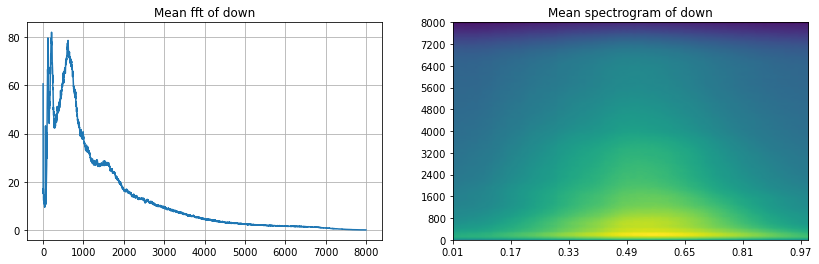

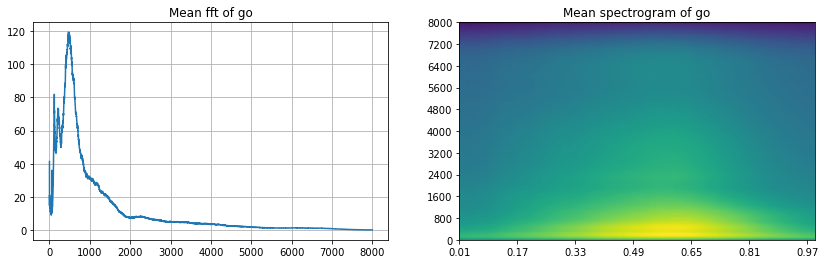

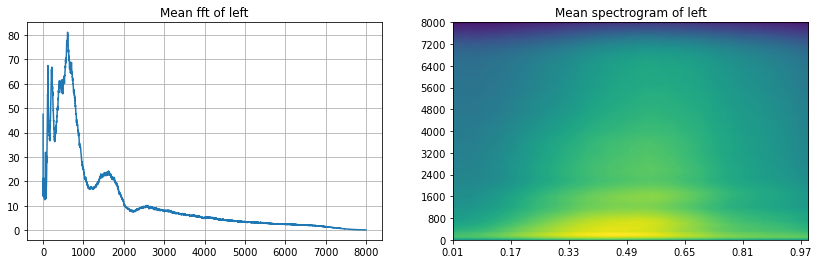

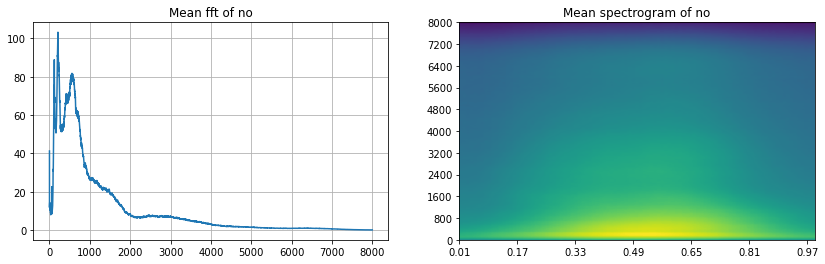

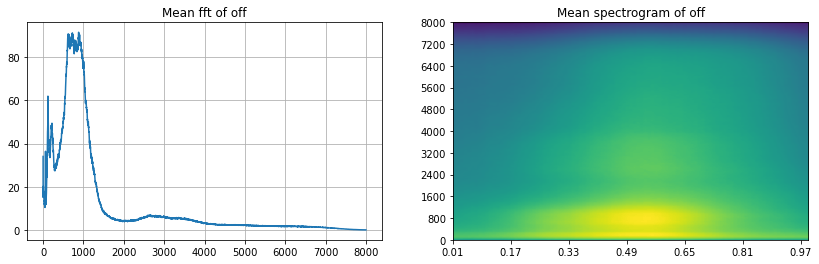

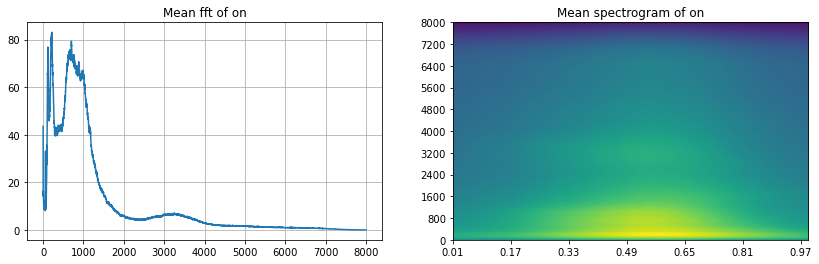

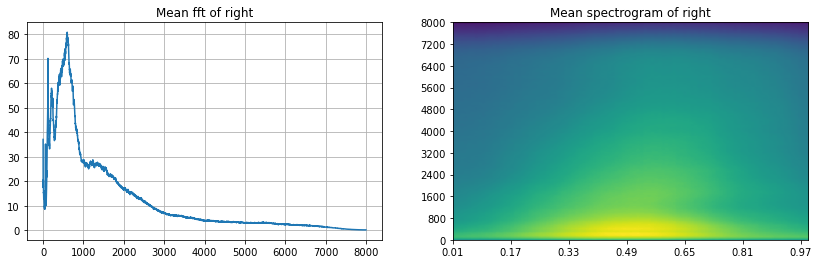

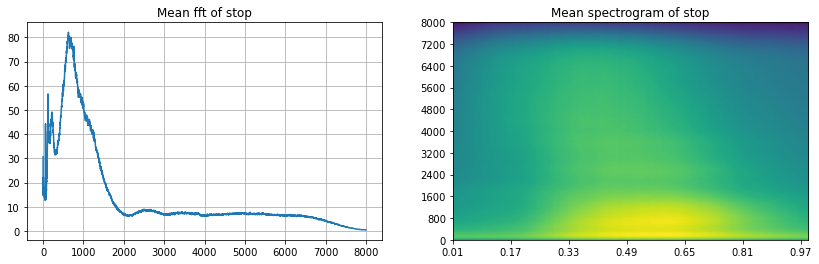

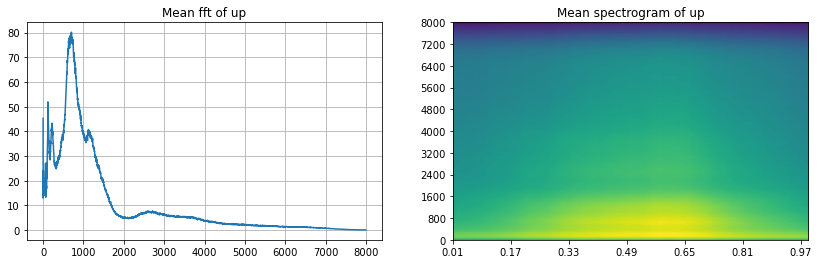

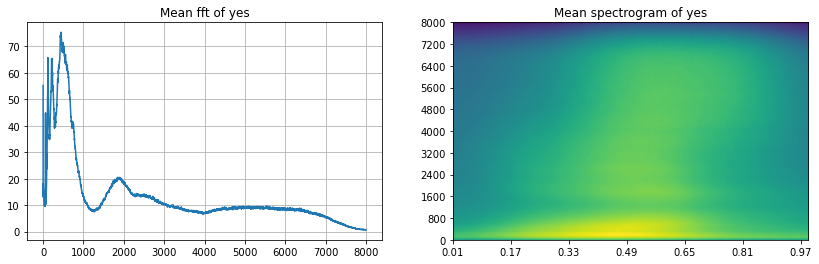

In [28]:
to_keep = 'yes no up down left right on off stop go'.split()
dirs = [d for d in dirs if d in to_keep]

print(dirs)

for direct in dirs:
    vals_all = []
    spec_all = []
    
    waves = [f for f in os.listdir(join(train_audio_path, direct))
            if f.endswith('.wav')]
    for wav in waves:
        sample_rate, samples = wavfile.read(train_audio_path + direct + '/'+wav)
        if samples.shape[0] != 16000:
            continue
        xf, vals = custom_fft(samples, 16000)
        vals_all.append(vals)
        freqs, times, spec = log_specgram(samples, 16000)
        spec_all.append(spec)
    plt.figure(figsize=(14,4))
    plt.subplot(121)
    plt.title('Mean fft of ' + direct)
    plt.plot(np.mean(np.array(vals_all), axis=0))
    plt.grid()
    plt.subplot(122)
    plt.title('Mean spectrogram of ' + direct)
    plt.imshow(np.mean(np.array(spec_all), axis=0).T, aspect='auto',
               origin='lower', extent=[times.min(), times.max(),
                                       freqs.min(), freqs.max()])
    plt.yticks(freqs[::16])
    plt.xticks(times[::16])
    plt.show()

## 2.5. Frequency components across the words

In [32]:
def violinplot_frequency(dirs, freq_ind):
    spec_all = []
    ind=0
    for direct in dirs:
        spec_all.append([])
        
        waves = [f for f in os.listdir(join(train_audio_path, direct))
                if f.endswith('.wav')]
        for wav in waves[:100]:
            sample_rate, samples = wavfile.read(
                train_audio_path + direct + '/' + wav)
            freqs, times, spec = log_specgram(samples, sample_rate)
            spec_all[ind].extend(spec[:, freq_ind])
        ind +=1
    minimun = min([len(spec) for spec in spec_all])
    spec_all = np.array([spec[:minimun] for spec in spec_all])
    
    plt.figure(figsize=(13,7))
    plt.title('Frequency' + str(freqs[freq_ind]) + ' Hz')
    plt.ylabel('Amount of frequency in a word')
    plt.xlabel('Words')
    sns.violinplot(data=pd.DataFrame(spec_all.T, columns=dirs))
    plt.show()

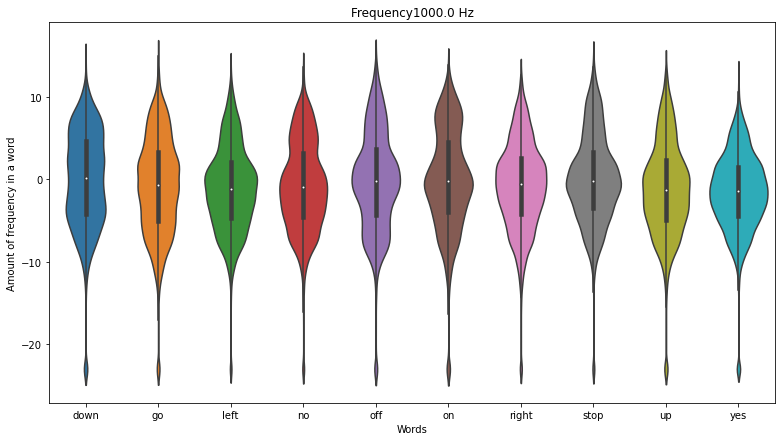

In [33]:
violinplot_frequency(dirs, 20)

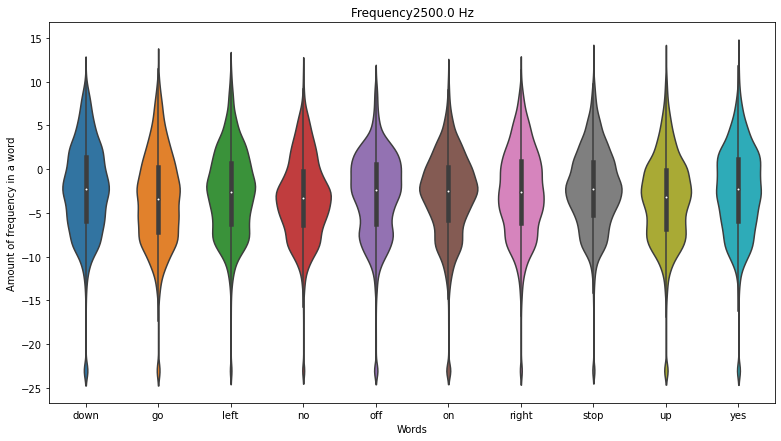

In [34]:
violinplot_frequency(dirs, 50)

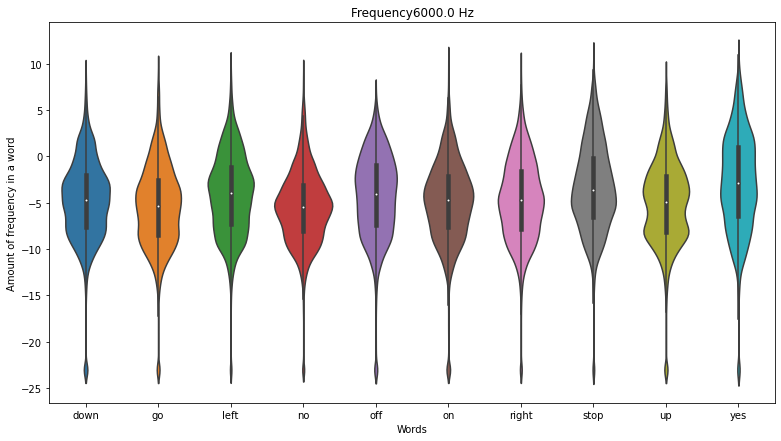

In [35]:
violinplot_frequency(dirs, 120)

## 2.7. Anomaly detection

우리는 눈에 띄는 녹취록이 있는지 확인해야한다. 데이터 집합의 차원을 낮추고 이상 징후가 있는지 대화식으로 확인할 수 있다. 데이터 차원을 감소하기 위해 PCA를 사용해보자.

In [ ]:
fft_all = []
names = []
for direct in dirs:
    waves = [f for f in os.listdir(join(train_audio_path, direct)) if f.endswith('.wav')]
    for wav in waves:
        sample_rate, samples = wavfile.read(train_audio_path + direct + '/' + wav)
        if samples.shape[0] != sample_rate:
            samples = np.append(samples, np.zeros((sample_rate - samples.shape[0], )))
        x, val = custom_fft(samples, sample_rate)
        fft_all.append(val)
        names.append(direct + '/' + wav)

fft_all = np.array(fft_all)

# Normalization
fft_all = (fft_all - np.mean(fft_all, axis=0)) / np.std(fft_all, axis=0)

In [43]:
# Dim reduction : 차원 축소 
pca = PCA(n_components=3)
fft_all = pca.fit_transform(fft_all)

# 3d 차트로보기
def interactive_3d_plot(data, names):
    scatt = go.Scatter3d(x=data[:, 0], y=data[:, 1], z=data[:, 2], mode='markers', text=names)
    data = go.Data([scatt])
    layout = go.Layout(title="Anomaly detection")
    figure = go.Figure(data=data, layout=layout)
    py.iplot(figure)
    
interactive_3d_plot(fft_all, names)

c:\users\hanbit\appdata\local\programs\python\python37\lib\site-packages\plotly\graph_objs\_deprecations.py:40: DeprecationWarning:

plotly.graph_objs.Data is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogram
  - etc.


